# Week 5

Phew. You've handed in the assignment. But there's not resting now. We're just hitting out grove, so let's get going!! Much to get through today.

## The plan for today

We continue learning about dataviz by focusing on data with two variables and their relationships. The lecture today has the following parts:
* In part 1, we talk about exploring data with two variables, make some logarithmic plots and think about what we have read in DAOST.
* Then, in part 2, we use sklearn and have fun with linear regression.

Ok. Now it's time to get started.

## Part 1: Exploratory data visualzation, two variables  

I told you how I love the Data Analysis with Open Source Tools book. You had to read Chapter 3, which is about visualizing data with two variables, before coming to class today. If you haven't yet, this is the time to do it! 

*Reading*: DAOST Chapter 3 up to *Graphical Analysis and Presentation Graphics* on page 68 in the PDF. **You will have to go and get it on DTU Learn due to the copyright stuff**.

And now a few exercises to reflect on the text:

*Exercise:* Questions from DAOST Chapter 3.

> * Looking at Fig 3-1, Janert writes "the data itself shows clearly that the amount of random noise in the data is small". What do you think his argument is?
> * Can you think of a real-world example of a multivariate relationship like the one in Fig 3-3 (lower right panel)?
> * What are the two methods Janert metions for smoothing noisy data? Can you think of other ones?
> * What are residuals? Why is it a good idea to plot the residuals of your fit?
> * Explain in your own words the point of the smooth tube in figure 3-7.
> * What the h#ll is banking and what part of our visual system does it use to help us see patterns? What are potential problems with banking?
> * Summarize the discussion of Graphical Analysis and Presentation Graphics on pp. 68-69 in your own words.

Ok. Let's briefly talk about logarithms and logarithimic plots (if you take my networks class in the fall semester you'll se lots of loglog plots since they're important for understanding a key property of networks).

*Exercise 2.2*: Logarithms and logarithmic plots. 

> * First, a couple of questions:
>    * What kind of relationships will a semi-log plot help you discover?
>    * What kind of functions will loglog plots help you see?
> * Second, we are going to create a version of [this plot](https://github.com/suneman/socialdata2022/blob/main/files/CrimeOccurrencesByCategory.png) from Week 1, where you display the $y$-axis on log-scale. 
> * Third, let's also try a loglog plot. Inspired by [this article](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0183110) I would expect that especially theft could be characterized by a power law distribution also in San Francisco. Let's see if I'm right. 
>   - *Step 1:* Divide San Francisco into a grid **roughly** $100m \times 100m$. You can, for example use numpy to do this, I would call `np.histogram2d`, and searching the internet, it seems that there are also [ways to do this in pandas](https://stackoverflow.com/questions/39254704/pandas-group-bins-of-data-per-longitude-latitude). The earth isn't flat,so `lat,` `lon` aren't really squares, but it is OK to ignore. 
>       * **Hint 1**. I really mean approximately 100 meters. It can also be 200 meters. Or 80 meters. Or 300.
>       * **Hint 2**. Ignore outliers. We only want points that are on the SF peninsula
>       * **Hint 3**. We've made a little example of how you can do the binning. Get it [here](https://github.com/suneman/socialdata2022/blob/main/lectures/Week5_binning.ipynb).
>   - *Step 2:* Count the number of thefts occurring within each grid-square (use all data for all time).
>   - *Step 3:* Tally the counts. Count the number of squares with $k=0$ thefts. We call this $N(0)$. Next, count the number of grids with one crime to get $N(k=1)$. Keep going like this all the way up to $k=C_{max}$, where $C_{max}$ is the highest count of crimes you find in any grid space. 
>     * *Extra tip*: If you want all the details on binning for loglog axes, you can check out [Lecture 2, Part 3](https://github.com/SocialComplexityLab/socialgraphs2021/blob/main/lectures/Week2.ipynb) in my social graphs course.
>   - *Step 4:* Plot the distribution of $k+1$ vs $N(k)$ on linear axes.
>   - *Step 5:* Plot the distribution of $k+1$ vs $N(k)$ on loglog axes.
>   - *Step 6:* Answer the question. Was Sune correct in assuming that there is a power-law distribution of theft?

***Answers*** 

>    * What kind of relationships will a semi-log plot help you discover?

A semi-log plot will help you discover relationships that have exponential or logarithmic behavior in one of the variables. Specifically, a semi-log plot has one axis on a logarithmic scale and the other on a linear scale. This means that relationships that exhibit exponential growth or decay or logarithmic growth or decay will appear as a straight line on the semi-log plot.

>    * What kind of functions will loglog plots help you see?


A loglog plot will help you see power-law relationships. In a loglog plot, both the x and y axes are on a logarithmic scale, which means that relationships that follow a power-law distribution will appear as a straight line on the loglog plot.

> * Second, we are going to create a version of [this plot](https://github.com/suneman/socialdata2022/blob/main/files/CrimeOccurrencesByCategory.png) from Week 1, where you display the $y$-axis on log-scale. 

In [1]:
#### Exercise 1 ### 
import pandas as pd 
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "Garamond"
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
from sklearn.linear_model import LinearRegression
import pandas as pd
from math import radians, cos, sin, asin, sqrt
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns
import powerlaw
import pandas as pd
from datetime import datetime
from itertools import combinations

report_data = pd.read_csv("../Datasets/Police_Department_Incident_Reports__Historical_2003_to_May_2018.csv")
report_data["year"] = pd.to_datetime(report_data.Date, format = "%m/%d/%Y").dt.year
report_data = report_data.query("year != 2018")

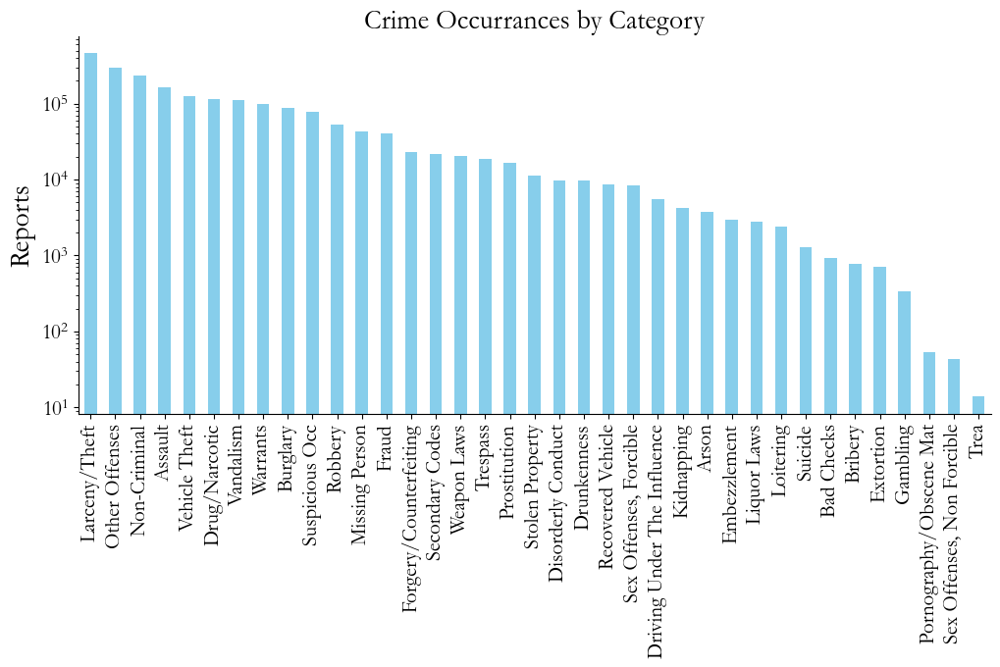

In [2]:
# point 2 and 3
category_count = report_data.Category.value_counts()

fig, ax = plt.subplots(figsize = (12,5))

category_count.plot.bar(color = "skyblue", ax=ax, fontsize = 15)
ax.set_title("Crime Occurrances by Category", size = 20)
ax.set_ylabel("Reports", size = 20)
ax.set_yscale("log")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Lowercase the tick labels
xticklabels = [label.get_text().title() for label in ax.get_xticklabels()]
ax.set_xticklabels(xticklabels)

plt.show()

> * Third, let's also try a loglog plot. Inspired by [this article](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0183110) I would expect that especially theft could be characterized by a power law distribution also in San Francisco. Let's see if I'm right. 
>   - *Step 1:* Divide San Francisco into a grid **roughly** $100m \times 100m$. You can, for example use numpy to do this, I would call `np.histogram2d`, and searching the internet, it seems that there are also [ways to do this in pandas](https://stackoverflow.com/questions/39254704/pandas-group-bins-of-data-per-longitude-latitude). The earth isn't flat,so `lat,` `lon` aren't really squares, but it is OK to ignore. 
>       * **Hint 1**. I really mean approximately 100 meters. It can also be 200 meters. Or 80 meters. Or 300.
>       * **Hint 2**. Ignore outliers. We only want points that are on the SF peninsula
>       * **Hint 3**. We've made a little example of how you can do the binning. Get it [here](https://github.com/suneman/socialdata2022/blob/main/lectures/Week5_binning.ipynb).

In [4]:
# Remove outliers 
report_data = report_data[(report_data.Y < 50) & (report_data.X<-122)]

Using Haversine Distance to calculate distance between two lon/lat coordinate. Taken from: https://stackoverflow.com/questions/4913349/haversine-formula-in-python-bearing-and-distance-between-two-gps-points

In [5]:
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371 # Radius of earth in kilometers. Use 3956 for miles
    return c * r

Figuring out the square that incapsulates our data (San Fransisco)

In [6]:
lat_min = report_data.Y.min()
lat_max = report_data.Y.max()
lon_min = report_data.X.min()
lon_max = report_data.X.max()

Figuring out how many bins we need to get 100m x 100m bins
Distances along the latitude is always the same even when we change the longitude
We multiply the output by 10 since the function returns the distance in kilometers and we want to know the distance per 100m

In [7]:
print(f"Estimated bin amount along the western border of San Fransisco: {haversine(lon_min, lat_min, lon_min, lat_max)*10}") 
print(f"Estimated bin amount along the eastern border of San Fransisco: {haversine(lon_max, lat_min, lon_max, lat_max)*10}")

Estimated bin amount along the western border of San Fransisco: 125.36317921721148
Estimated bin amount along the eastern border of San Fransisco: 125.36317921721148


Distance along the longitude changes depending on the latitude as also seen below.
Imagine moving 90 degrees when you're close to the north pole. You are not moving a lot of kilometers. Moving 90 degrees a long equator though, that is a long walk!
Since San Fransisco is relatively small in the big picture the difference is not that big as we can see, so we just assume it's flat even though we clearly see it is not.

In [8]:
print(f"Estimated bin amount along the northern border of San Fransisco: {haversine(lon_min, lat_max, lon_max, lat_max)*10}")
print(f"Estimated bin amount along the southern border of San Fransisco: {haversine(lon_min, lat_min, lon_max, lat_min)*10}")

Estimated bin amount along the northern border of San Fransisco: 130.78123566673807
Estimated bin amount along the southern border of San Fransisco: 130.9807444161078


Now we know we need 125x130 bins to get bins of approximately 100x100m 

In [9]:
count, lon, lat = np.histogram2d(report_data.Y, report_data.X, bins = [130,125])

Just to convince ourselves that what we have done makes sense we plot the counts.
Notice that I have limited the maximum value. I present to you San Fransisco by night! Or looks like it :)

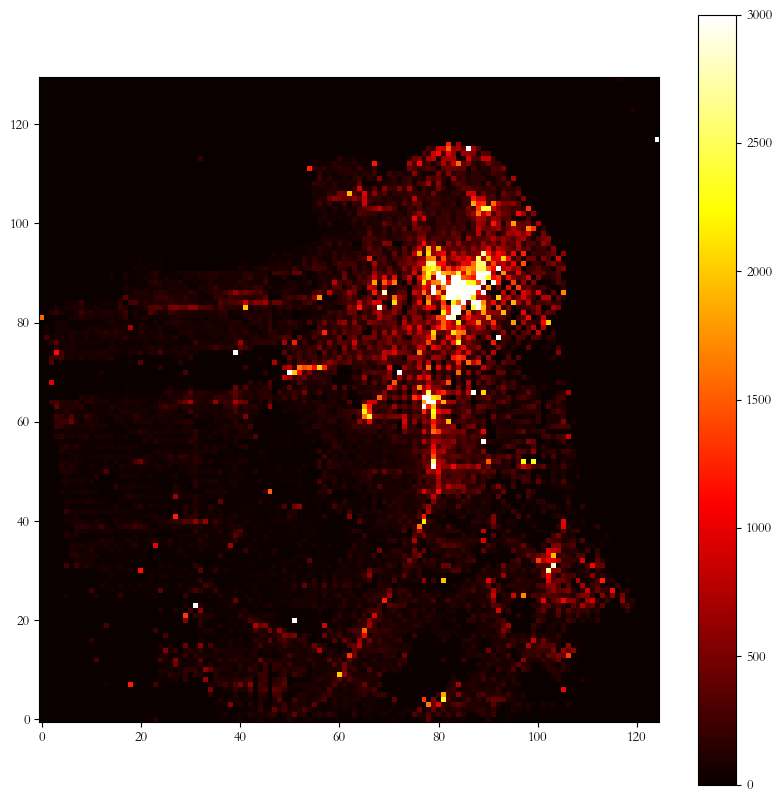

In [10]:
plt.figure(figsize=(10,10))
plt.imshow(count, cmap='hot',vmax=3000, origin='lower')
plt.colorbar()

>   - *Step 2:* Count the number of thefts occurring within each grid-square (use all data for all time).

In [11]:
count

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 2.]])

>   - *Step 3:* Tally the counts. Count the number of squares with $k=0$ thefts. We call this $N(0)$. Next, count the number of grids with one crime to get $N(k=1)$. Keep going like this all the way up to $k=C_{max}$, where $C_{max}$ is the highest count of crimes you find in any grid space. 
>     * *Extra tip*: If you want all the details on binning for loglog axes, you can check out [Lecture 2, Part 3](https://github.com/SocialComplexityLab/socialgraphs2021/blob/main/lectures/Week2.ipynb) in my social graphs course.


In [55]:
flat_count = [int(val) for row in count for val in row]
n_squares_with_n_reports = dict(Counter(flat_count))

c_max = max(n_squares_with_n_reports.keys())

# for n_reports in range(c_max+1):
#     try:
#         n_squares_with_n_reports[n_reports]
    
#     except KeyError:
#         """No squares with 'i' crime reports. Adding a 0 count value"""
#         n_squares_with_n_reports[n_reports] = 0

n_squares_with_n_reports = pd.Series(n_squares_with_n_reports).sort_index()

>   - *Step 4:* Plot the distribution of $k+1$ vs $N(k)$ on linear axes.

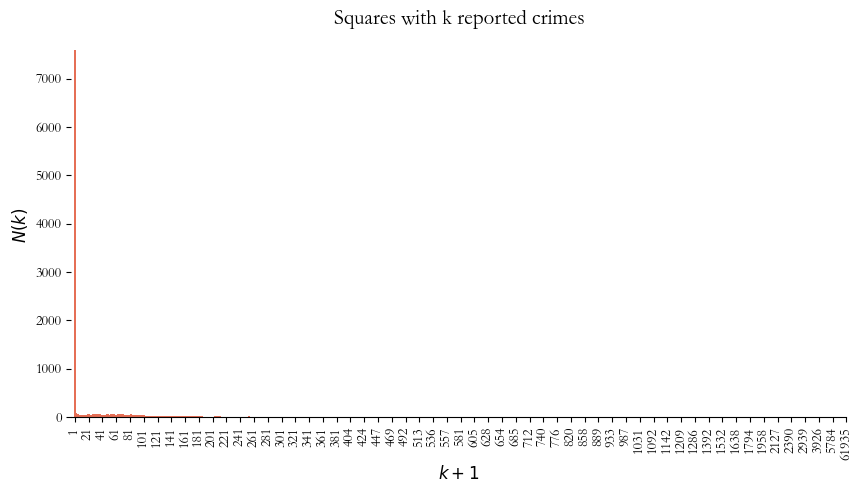

In [79]:
fig, ax = plt.subplots(figsize = (10,5))

sns.barplot(x=n_squares_with_n_reports.index+1,
            y=n_squares_with_n_reports.values,
            color = "#FD603E",
            width = 3)

ax.set_xlim([-5, ax.get_xticks()[-1]])
ax.set_title("Squares with k reported crimes", size = 15)
ax.set_ylabel("$N(k)$", size = 12)
ax.set_xlabel("$k+1$", size = 12)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Lowercase the tick labels
ax.set_xticks(ax.get_xticks()[::20], ax.get_xticklabels()[::20], rotation = 90)

plt.show()

>   - *Step 5:* Plot the distribution of $k+1$ vs $N(k)$ on loglog axes.

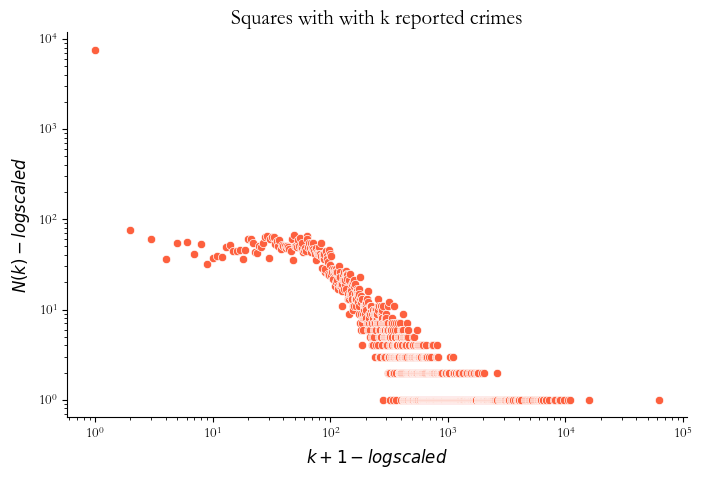

In [85]:
fig, ax = plt.subplots(figsize = (8,5))

sns.scatterplot(x=n_squares_with_n_reports.index+1,
                y=n_squares_with_n_reports.values,
                color = "#FD603E")

ax.set_title("Squares with with k reported crimes", size = 15)
ax.set_ylabel("$N(k) - log scaled$", size = 12)
ax.set_xlabel("$k+1 - log scaled$", size = 12)
ax.set_xscale("log")
ax.set_yscale("log")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.show()

>   - *Step 6:* Answer the question. Was Sune correct in assuming that there is a power-law distribution of theft?

In [83]:
print('Degree exponent for N(k):', powerlaw.Fit(n_squares_with_n_reports.values, verbose = False).alpha)

Degree exponent for N(k): 1.8067167535542674


Sort of. The distribution does not look to follow a power-law distribution in the interval $0<k<100$, as there looks to be too few squares with k reported crimes in this interval, for it to be powerlaw distributed. 

Below is a plot of a more clear powerlaw distribution:

<img src = "https://mathinsight.org/media/image/image/power_law_degree_distribution_scatter.png"
style="background-color:white">




## Part 2: Linear Regression

So, now it's time for fun with standard linear regression! We'll get into that by asking the following question. 

> *Which pair of focus crimes have the the most similar temporal pattern across the week? (And which pair is most dissimilar).*

Below I list the focus-crimes for your convenience

In [84]:
focuscrimes = set(['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT'])

One way to answer this question is to plot the activity for all pairs of crimetypes as scatter plot per pair. One crime type on each axis, and where each point in the scatter corresponds to an hour of the week, and the number of crimes of crime-type 1 is on the $x$-axis and the number of crimes of crime-type 2 is on the $y$-axis. (So there will be 168 points in each scatterplot.) If we look at 14 focus crimes that results in 91 pairwise comparisons. 

*Exercise*: Create the 91 scatterplots.
> * Display the plots in a $7$ by $13$ subplot matrix. You can use matplotlib's `subplot` to organize those plots. With $7$ across and $13$ down, you should be able to squeeze them all onto a single [a4](https://en.wikipedia.org/wiki/ISO_216#A_series) page.
>     * Make sure to label each one with the two crime-types you're comparing so we can easily inspect visually.
>     * Make sure that that you squeeze the subplots closely together so each plot can be as big as possible. 
> * Just inspecting this matrix, which crime-types look correlated and which one look like they're very different?

In [119]:
crimetype_pairs = list(combinations(focuscrimes, r = 2))
focuscrime_data = report_data[report_data.Category.isin(focuscrimes)].copy()

focuscrime_data["Date"] = pd.to_datetime(focuscrime_data.Date, format = "%m/%d/%Y")
focuscrime_data["Year"] = focuscrime_data["Date"].dt.year
focuscrime_data.query("Year != 2018")

# Extract relevant time-periods
focuscrime_data["Hour"] = pd.to_datetime(focuscrime_data["Time"], format="%H:%M").dt.hour.astype(str)
focuscrime_data["Weekday"] = focuscrime_data["Date"].dt.day_name()
focuscrime_data["Weekday_Hour"] = focuscrime_data["Weekday"] + " " + focuscrime_data["Hour"] 


# Count number of reported crimes by Category and Weekday-hour
count_of_crimes_by_category_and_weekhour = focuscrime_data.groupby(["Category", "Weekday_Hour"]).PdId.agg("count").rename("count").reset_index()

In [187]:
def update_axes_idx(itr, 
                    ax_row_idx, 
                    ax_col_idx):
    
    ''' 
    Function to automatically navigate the ax-element. 
    After every second iteration, raise the row idx and
    reset the column idx. Return updated indices.
    ''' 

    if (itr+1) % 13 == 0: 
        ax_col_idx += 1
        ax_row_idx = 0

    else:
        ax_row_idx += 1

    return ax_row_idx, ax_col_idx

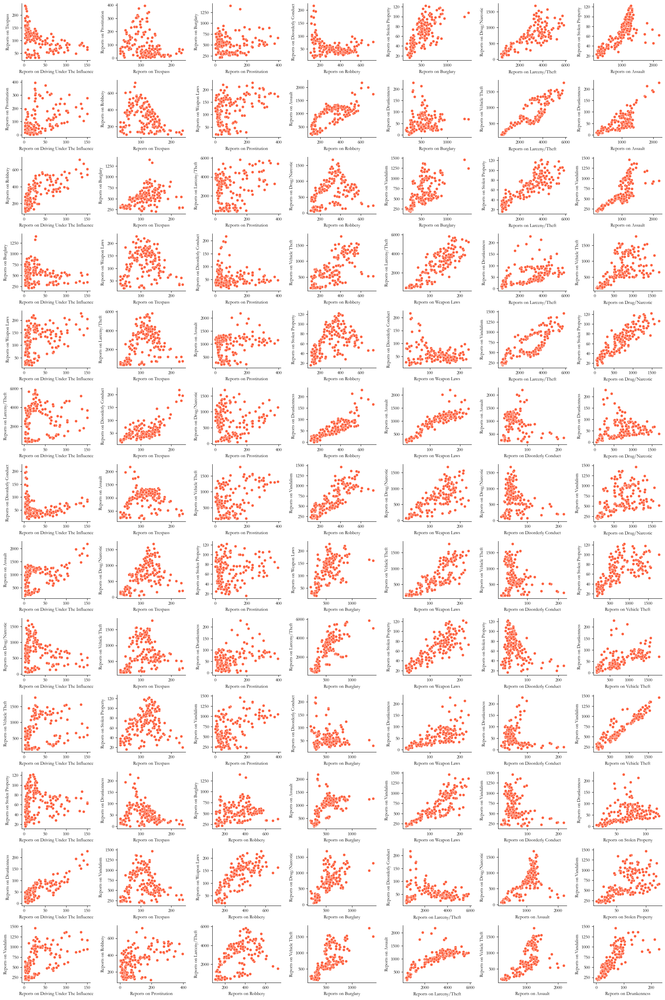

In [320]:
fig, ax = plt.subplots(13,7, figsize = (20,30))

ax_row_idx, ax_col_idx = 0, 0 # indexes for the "ax"-attribute

for itr, crime_pair in enumerate(crimetype_pairs):
    crime1_count = count_of_crimes_by_category_and_weekhour.query(f"Category == '{crime_pair[0]}'")
    crime2_count = count_of_crimes_by_category_and_weekhour.query(f"Category == '{crime_pair[1]}'")
    crime_pair_count_by_weekhour = crime1_count.merge(crime2_count, on = "Weekday_Hour", how = "inner")

    sns.scatterplot(x = "count_x",
                    y = "count_y",
                    data = crime_pair_count_by_weekhour,
                    color =  "#FD603E",
                    ax=ax[ax_row_idx][ax_col_idx])

    ax[ax_row_idx][ax_col_idx].spines['top'].set_visible(False)
    ax[ax_row_idx][ax_col_idx].spines['right'].set_visible(False)   

    ax[ax_row_idx][ax_col_idx].set_xlabel(f"Reports on {crime_pair[0].title()}")
    ax[ax_row_idx][ax_col_idx].set_ylabel(f"Reports on {crime_pair[1].title()}")


    ax_row_idx, ax_col_idx = update_axes_idx(itr, ax_row_idx, ax_col_idx)
    
plt.tight_layout()
plt.suptitle("")
plt.show()

---

Next it's time for the linear regression. Janert writes about this on page 63-66. 

There is a closed-form solution for linear regression. If you want to find the best straight line $y = ax + b$ fit to a set of $N$ points $\{(x_1,y_1), (x_2,y_2), \ldots (x_N,y_N)\}$, the value of $b$ is

$$
\tag{1}
b = \langle y \rangle - a \langle x \rangle,
$$

where $\langle x \rangle = (1/N)\sum_i x_i$ is the mean value of the $x_i$ and $\langle y \rangle = (1/N)\sum_i x_i$ is the mean value of the $y_i$. 

And the value for the slope $a$ is 

$$
\tag{2}
a = \frac{\sum_{i=1}^N \left( x_iy_i \right) - N \langle x\rangle\langle y\rangle }{\sum_{i=1}^N\left( x_i^2 \right) - N\langle x\rangle^2}.
$$


A couple of years ago, I actually derived the whole thing. I've taken it out of the notebook. But if you'd like to take a look (it's a fun and instructive little exercise), you can find it **[here](https://github.com/suneman/socialdata2021/blob/main/lectures/LinearRegressionDerived.ipynb)**. 

We are going to focus on the fit for now, but keep in mind what we have learnt so far about the purpose of linear regression! 

*Exercise:* Linear regression.

> * Using the formulas we derived above (Equation 1 and 2), calculate the slopes for $a$ and $b$ in each case. (You can compare the results with ones obtained using a package like `sklearn` to check that everything is working as expected.)
> * You can add even more information to this plot by coloring each point according to its hour of the week. So create a gradient going from one color to another, and color each point according to the gradient. (So let's say your two colors are red and blue, then the Sunday, midnight to 1am bin will be red and the following Sunday, 11pm - midnight bin will be blue).

From ChatGPT - function to make linear regression 

In [192]:
import numpy as np

def linear_regression(x, y):
    """
    Calculates the slope and intercept for a linear regression.

    Parameters:
        x (array-like): The independent variable.
        y (array-like): The dependent variable.

    Returns:
        slope (float): The slope of the linear regression line.
        intercept (float): The intercept of the linear regression line.
    """
    x_mean = np.mean(x)
    y_mean = np.mean(y)
    n = len(x)

    # Calculate the slope and intercept of the linear regression line
    numerator = np.sum((x - x_mean) * (y - y_mean))
    denominator = np.sum((x - x_mean) ** 2)
    slope = numerator / denominator
    intercept = y_mean - slope * x_mean

    return slope, intercept

Own function

In [203]:
X = crime_pair_count_by_weekhour.count_x.values 
y = crime_pair_count_by_weekhour.count_y.values

linear_regression(X, y)

(5.8501330724230804, 329.32209756687075)

Using Sklearn

In [205]:
reg = LinearRegression().fit(X.reshape(-1, 1), y.reshape(-1, 1))
reg.coef_, reg.intercept_

(array([[5.85013307]]), array([329.32209757]))

Create colormap and order timestamps

In [329]:
# Create list with N_colors between color1 and color2
N_colors = 168 
color1 = "#FF362F"
color2 = "#2F52FF"
cmap = LinearSegmentedColormap.from_list(
        "Custom", [color1, color2], N=N_colors
        )
color_list = [mcolors.rgb2hex(cmap(i)) for i in range(N_colors)]

# Order observations from Midnight Monday to 11Am Sunday 
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_hour_order = [weekday + " " + str(hour) for weekday in weekday_order for hour in range(24)]

# Convert the "Weekday_Hour" column to a categorical column with the custom order
count_of_crimes_by_category_and_weekhour["Weekday_Hour"] = pd.Categorical(count_of_crimes_by_category_and_weekhour["Weekday_Hour"], categories=weekday_hour_order, ordered=True)
count_of_crimes_by_category_and_weekhour.sort_values("Weekday_Hour", inplace = True)
count_of_crimes_by_category_and_weekhour.reset_index(drop = True, inplace = True)

One could simply use seaborns `regplot`. 

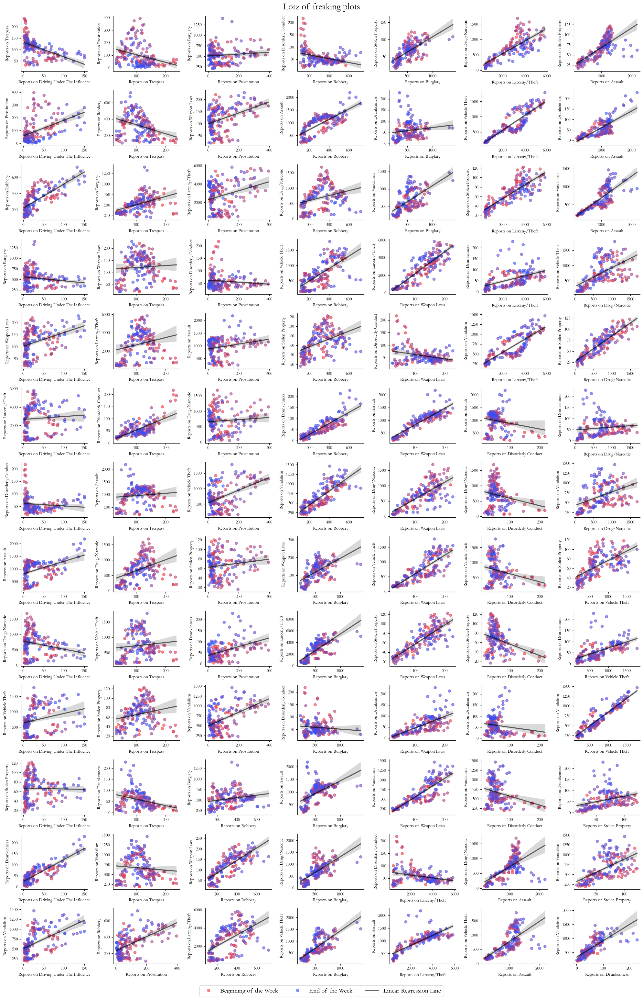

In [408]:
fig, ax = plt.subplots(13,7, figsize = (20,30))

ax_row_idx, ax_col_idx = 0, 0 # indexes for the "ax"-attribute

for itr, crime_pair in enumerate(crimetype_pairs):
    crime1_count = count_of_crimes_by_category_and_weekhour.query(f"Category == '{crime_pair[0]}'")
    crime2_count = count_of_crimes_by_category_and_weekhour.query(f"Category == '{crime_pair[1]}'")
    crime_pair_count_by_weekhour = crime1_count.merge(crime2_count, on = "Weekday_Hour", how = "inner")

    sns.regplot(x = "count_x",
                y = "count_y",
                data = crime_pair_count_by_weekhour,
                scatter_kws = {"color":color_list, "alpha":0.6},
                line_kws = {"color":"black", "alpha":0.6},
                ax=ax[ax_row_idx][ax_col_idx])
    
    ax[ax_row_idx][ax_col_idx].spines['top'].set_visible(False)
    ax[ax_row_idx][ax_col_idx].spines['right'].set_visible(False)  

    ax[ax_row_idx][ax_col_idx].set_xlabel(f"Reports on {crime_pair[0].title()}")
    ax[ax_row_idx][ax_col_idx].set_ylabel(f"Reports on {crime_pair[1].title()}")


    ax_row_idx, ax_col_idx = update_axes_idx(itr, ax_row_idx, ax_col_idx)

# Set legend 
legend_entries = [
    Line2D([0], [0], color = color1, ls="", marker = "o", label = "Beginning of the Week", alpha = 0.6),
    Line2D([0], [0], color = color2, ls="", marker = "o", label = "End of the Week", alpha = 0.6),
    Line2D([0], [0], color= 'black', ls='-', lw=2, label='Linear Regression Line', alpha = 0.6)
]

fig.legend(handles = legend_entries, loc='upper center',
           bbox_to_anchor=(0.5, 0), ncol = 3, fontsize = "x-large")

plt.tight_layout()
plt.suptitle("Lotz of freaking plots", y = 1.008, size = 20)
plt.show()

If we have to use the `linear_regression` function manually... 

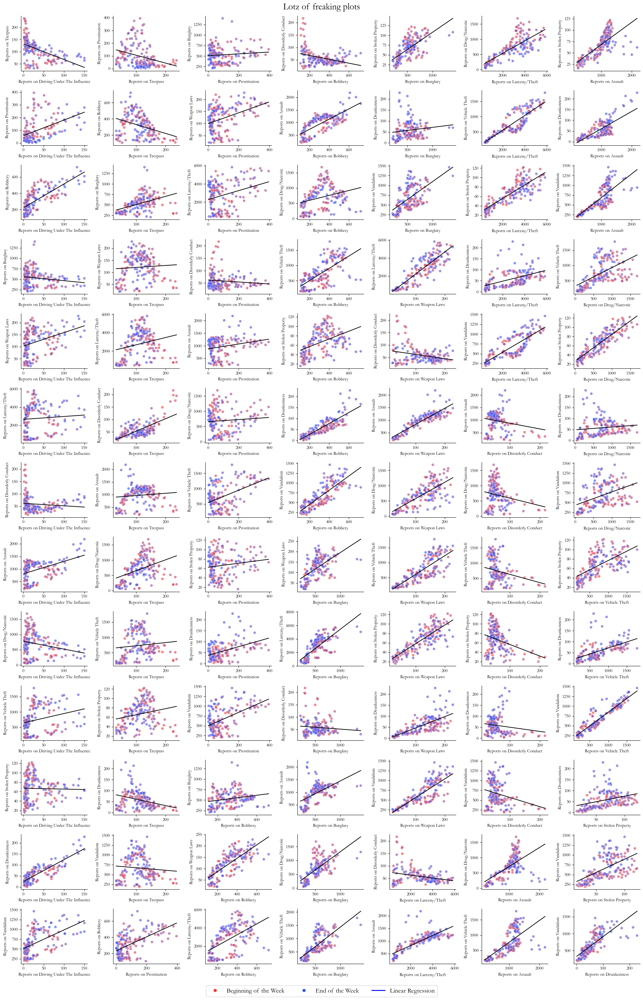

In [341]:
fig, ax = plt.subplots(13,7, figsize = (20,30))

ax_row_idx, ax_col_idx = 0, 0 # indexes for the "ax"-attribute

for itr, crime_pair in enumerate(crimetype_pairs):
    crime1_count = count_of_crimes_by_category_and_weekhour.query(f"Category == '{crime_pair[0]}'")
    crime2_count = count_of_crimes_by_category_and_weekhour.query(f"Category == '{crime_pair[1]}'")
    crime_pair_count_by_weekhour = crime1_count.merge(crime2_count, on = "Weekday_Hour", how = "inner")

    X = crime_pair_count_by_weekhour.count_x
    y = crime_pair_count_by_weekhour.count_y

    # Plot scatterplot
    sns.scatterplot(x = X,
                    y = y,
                    color = color_list,
                    alpha = 0.6, 
                    ax=ax[ax_row_idx][ax_col_idx])

    # Calculate linear regression
    _slope, _intercept = linear_regression(X, y)
    f = lambda x: _slope*x + _intercept

    # Plot Regression Line 
    sns.lineplot(x=X,
                y=f(X),
                color = "black",
                alpha = 0.6, 
                ax = ax[ax_row_idx][ax_col_idx])
    
    ax[ax_row_idx][ax_col_idx].spines['top'].set_visible(False)
    ax[ax_row_idx][ax_col_idx].spines['right'].set_visible(False)  

    ax[ax_row_idx][ax_col_idx].set_xlabel(f"Reports on {crime_pair[0].title()}")
    ax[ax_row_idx][ax_col_idx].set_ylabel(f"Reports on {crime_pair[1].title()}")


    ax_row_idx, ax_col_idx = update_axes_idx(itr, ax_row_idx, ax_col_idx)

# Set legend 
legend_entries = [
    Line2D([0], [0], color = color1, ls="", marker = "o", label = "Beginning of the Week", alpha = 0.6),
    Line2D([0], [0], color = color2, ls="", marker = "o", label = "End of the Week", alpha = 0.6),
    Line2D([0], [0], color= 'black', ls='-', lw=2, label='Linear Regression', alpha = 0.6)
]

fig.legend(handles = legend_entries, loc='upper center',
           bbox_to_anchor=(0.5, 0), ncol = 3, fontsize = "x-large")

plt.tight_layout()
plt.suptitle("Lotz of freaking plots", y = 1.008, size = 20)
plt.show()

---

But the question we started with was "Which pair of focus crimes have the the most similar temporal pattern across the week?". We haven't really answered that yet. So let's calculate one last thing: $R^2$. You probably also remember this one. 

Basically $R^2$ is a measures of how good a linear fit is. You can [read about $R^2$ on wikipedia](https://en.wikipedia.org/wiki/Coefficient_of_determination). 

*Exercise:* Goodness of fit as a measure of correlation. 
> * Write a little function to calculate $R^2$ alongside each linear fit. (Again you can compare it with a package to check that it works, e.g. the one provided by the function `score()` in `sklearn`.)
> * Explain the connection between $R^2$ and the [Pearson correlation coefficient](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient).
> * **According to the fits and associated $R^2$**, which pair of crimes have the **most similar** temporal pattern. Discuss your finding: Does it make sense? Why?/Why not?
> * According to your fits and associated measure of $R^2$, which pair of crimes have the **most dissimilar** temporal pattern. Discuss your finding: Does it make sense? Why?/Why not?
> * Create a final mega-plot with all of the 91 megaplots, fits, and $R^2$ value written as [text](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.text.html) on each plot. In this figure, you should also find a way to visually highlight the two most similar/dissimilar crimes.

> * Write a little function to calculate $R^2$ alongside each linear fit. (Again you can compare it with a package to check that it works, e.g. the one provided by the function `score()` in `sklearn`.)

In [345]:
def calculate_r2_score(y_true, y_pred):
    """
    Calculates the R-squared (R2) score.

    Parameters:
    y_true (array-like): True values of the dependent variable.
    y_pred (array-like): Predicted values of the dependent variable.

    Returns:
    float: The R-squared score.
    """
    # Calculate the mean of the true values
    mean_true = sum(y_true) / len(y_true)
    
    # Calculate the sum of the squared differences between the true and predicted values
    ss_res = sum((y_true[i] - y_pred[i]) ** 2 for i in range(len(y_true)))
    
    # Calculate the sum of the squared differences between the true values and their mean
    ss_tot = sum((y_true[i] - mean_true) ** 2 for i in range(len(y_true)))
    
    # Calculate the R2 score
    r2 = 1 - (ss_res / ss_tot)
    
    return r2

> * Create a final mega-plot with all of the 91 megaplots, fits, and $R^2$ value written as [text](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.text.html) on each plot. In this figure, you should also find a way to visually highlight the two most similar/dissimilar crimes.

Find  most/least similar crime pairs based on $R^{2}$ - used to highlight these in the plot

In [417]:
list_of_r2 = []

for itr, crime_pair in enumerate(crimetype_pairs):
    crime1_count = count_of_crimes_by_category_and_weekhour.query(f"Category == '{crime_pair[0]}'")
    crime2_count = count_of_crimes_by_category_and_weekhour.query(f"Category == '{crime_pair[1]}'")
    crime_pair_count_by_weekhour = crime1_count.merge(crime2_count, on = "Weekday_Hour", how = "inner")

    X = crime_pair_count_by_weekhour.count_x
    y = crime_pair_count_by_weekhour.count_y

    _slope, _intercept = linear_regression(X, y)
    f = lambda x: _slope*x + _intercept

    R_squared = calculate_r2_score(y, f(X))
    list_of_r2.append(R_squared)

least_similar_threshold = sorted(list_of_r2)[0]
most_similar_threshold = sorted(list_of_r2)[-1]

In [410]:
most_similar_color = "#7DE553"
least_similar_color = "#FFB02F"

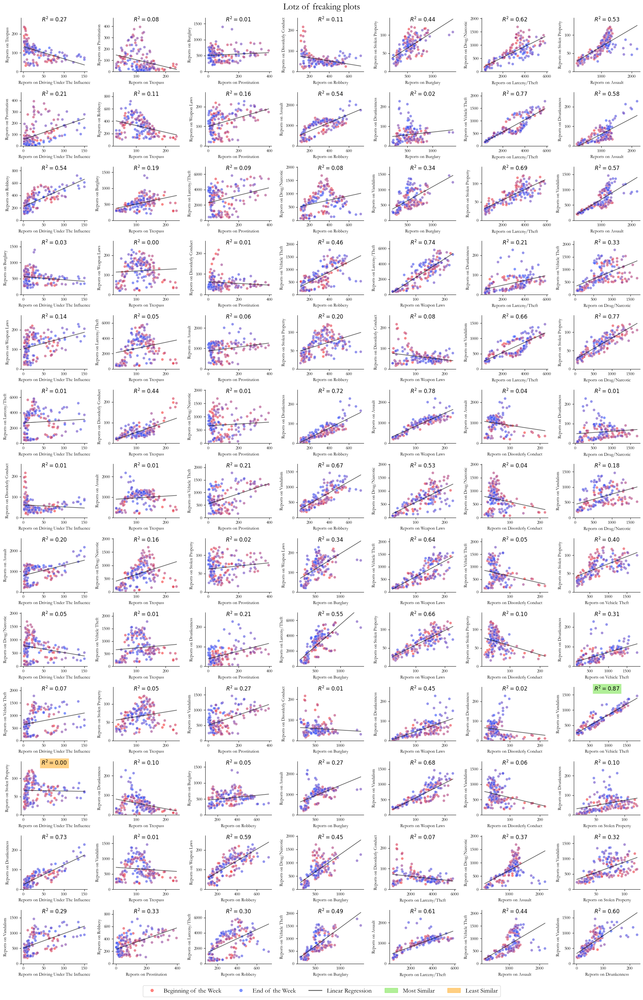

In [420]:
fig, ax = plt.subplots(13,7, figsize = (20,30))

ax_row_idx, ax_col_idx = 0, 0 # indexes for the "ax"-attribute

for itr, crime_pair in enumerate(crimetype_pairs):
    crime1_count = count_of_crimes_by_category_and_weekhour.query(f"Category == '{crime_pair[0]}'")
    crime2_count = count_of_crimes_by_category_and_weekhour.query(f"Category == '{crime_pair[1]}'")
    crime_pair_count_by_weekhour = crime1_count.merge(crime2_count, on = "Weekday_Hour", how = "inner")

    X = crime_pair_count_by_weekhour.count_x
    y = crime_pair_count_by_weekhour.count_y

    # Plot scatterplot
    sns.scatterplot(x = X,
                    y = y,
                    color = color_list,
                    alpha = 0.6, 
                    ax=ax[ax_row_idx][ax_col_idx])

    # Calculate linear regression
    _slope, _intercept = linear_regression(X, y)
    f = lambda x: _slope*x + _intercept

    # Plot Regression Line 
    sns.lineplot(x=X,
                y=f(X),
                color = "black",
                alpha = 0.6, 
                ax = ax[ax_row_idx][ax_col_idx])
    
    # Calculate R-squared 
    R_squared = calculate_r2_score(y, f(X))

    # Add R-squared as title 
    ax[ax_row_idx][ax_col_idx].set_ylim([0, y.max() * 1.2])

    if R_squared >= most_similar_threshold:
        ax[ax_row_idx][ax_col_idx].set_title(label = f"$R^{2} = {R_squared:.2f}$", y=0.88, loc='center', bbox=dict(facecolor=most_similar_color, alpha=0.6, edgecolor = "white")) #backgroundcolor=most_similar_color, alpha = 0.6)

    elif R_squared <= least_similar_threshold:
        ax[ax_row_idx][ax_col_idx].set_title(label = f"$R^{2} = {R_squared:.2f}$", y=0.88, loc='center', bbox=dict(facecolor=least_similar_color, alpha=0.6, edgecolor = "white")) #backgroundcolor=least_similar_color, alpha = 0.6)

    else:
        ax[ax_row_idx][ax_col_idx].set_title(label = f"$R^{2} = {R_squared:.2f}$", y=0.88, loc='center')
    
    ax[ax_row_idx][ax_col_idx].spines['top'].set_visible(False)
    ax[ax_row_idx][ax_col_idx].spines['right'].set_visible(False)  

    ax[ax_row_idx][ax_col_idx].set_xlabel(f"Reports on {crime_pair[0].title()}")
    ax[ax_row_idx][ax_col_idx].set_ylabel(f"Reports on {crime_pair[1].title()}")


    ax_row_idx, ax_col_idx = update_axes_idx(itr, ax_row_idx, ax_col_idx)

# Set legend 
legend_entries = [
    Line2D([0], [0], color = color1, ls="", marker = "o", label = "Beginning of the Week", alpha = 0.6),
    Line2D([0], [0], color = color2, ls="", marker = "o", label = "End of the Week", alpha = 0.6),
    Line2D([0], [0], color= 'black', ls='-', lw=2, label='Linear Regression', alpha = 0.6),
    Patch(color = most_similar_color, label = "Most Similar", alpha = 0.6),
    Patch(color = least_similar_color, label = "Least Similar", alpha = 0.6)
]

fig.legend(handles = legend_entries, loc='upper center',
           bbox_to_anchor=(0.5, 0), ncol = 5, fontsize = "x-large")

plt.tight_layout()
plt.suptitle("Lotz of freaking plots", y = 1.008, size = 20)
plt.show()